In [1]:
import sensitivity_calculator as sens
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# calculate CCAT sensitivities

inputs = {'diameter': 5.7, 't': 273, 'wfe': 10.7, 'eta': 0.98, 'doe': 0.8, 't_int': 1, 'pixelYield': 0.8, 
        'szCamNumPoln': 1, 'eorSpecNumPoln': 2, 't_filter_cold': np.array([0.593, 0.84 , 0.909, 0.922, 0.89 ]), 
        't_lens_cold': np.array([0.98, 0.98, 0.98, 0.98, 0.98]), 
        't_uhdpe_window': np.array([0.96, 0.97, 0.97, 0.97, 0.97]), 
        'singleModedAOmegaLambda2': np.array([1., 1., 1., 1., 1.]), 
        'spatialPixels': np.array([36450, 20808, 10368, 10368,  7938]), 
        'eqbw': np.array([9.7e+10, 3.0e+10, 3.6e+10, 7.0e+10, 5.6e+10]), 
        'centerFrequency': np.array([8.50e+11, 4.05e+11, 3.48e+11, 2.85e+11, 2.22e+11]), 'detectorNEP': 0, 
        'backgroundSubtractionDegradationFactor': 1, 'r': np.array([[100., 100., 100.],
                                            [100., 100., 100.],
                                            [100., 100., 100.],
                                            [100., 100., 100.],
                                            [100., 100., 100.]]), 
        'decimalPlaces': 3, 'observationElevationAngle': 45, 'outputFreq': True, 
        'detectorSpacing': np.array([1.51, 1.97, 2.75, 2.75, 3.13]), 'lyotStopAngle': 13.4}
# Alternatively, sens.getInputs("input.yaml")

spillEfficiency = sens.getSpillEfficiency(inputs)
calculate = sens.calcByAngle(inputs["diameter"], inputs["t"], inputs["wfe"], inputs["eta"], inputs["doe"], inputs["t_int"], inputs["pixelYield"], inputs["szCamNumPoln"], inputs["eorSpecNumPoln"],
                            inputs["t_filter_cold"], inputs["t_lens_cold"], inputs["t_uhdpe_window"], spillEfficiency, inputs["singleModedAOmegaLambda2"],
                            inputs["spatialPixels"], inputs["eqbw"], inputs["centerFrequency"], inputs["detectorNEP"],
                            inputs["backgroundSubtractionDegradationFactor"], inputs["r"])
outputs = calculate(45)
data_C = sens.sensitivity._data_C_calcV2(inputs)

In [3]:
ell, N_ell_T_full, N_ell_P_full = sens.getNoiseCurves(inputs, outputs)

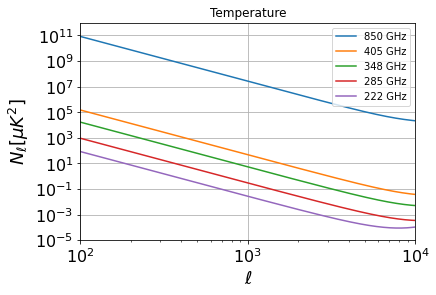

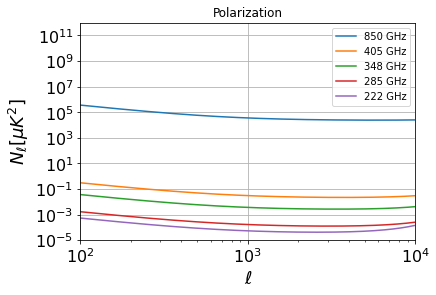

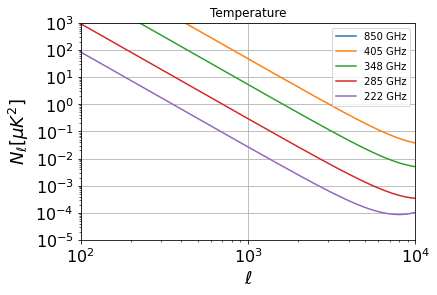

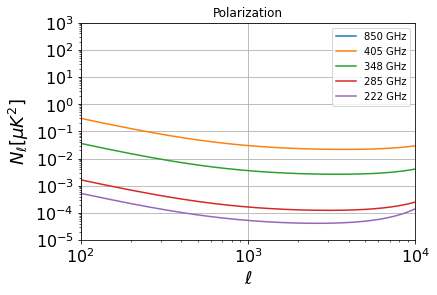

In [4]:
for curves, labels, title in zip([N_ell_T_full, N_ell_P_full], [inputs["centerFrequency"]] * 2, ["Temperature", "Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell, curve, label=str(int(label/1e9))+' GHz')
    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**4)
    plt.ylim(10**-5, 10**12)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()
    
for curves, labels, title in zip([N_ell_T_full, N_ell_P_full], [inputs["centerFrequency"]] * 2, ["Temperature", "Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell, curve, label=str(int(label/1e9))+' GHz')
    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**4)
    plt.ylim(10**-5, 10**3)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()

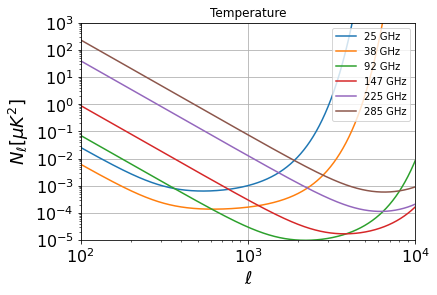

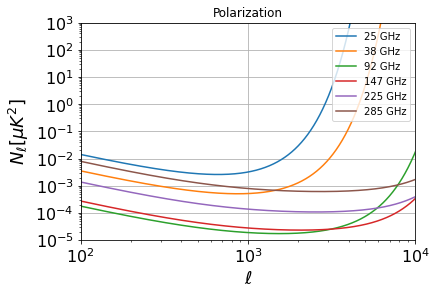

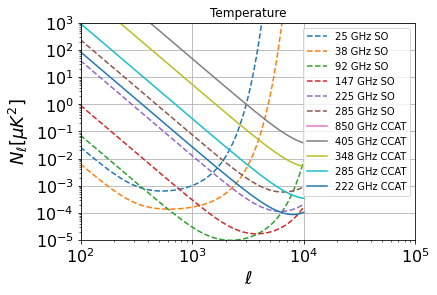

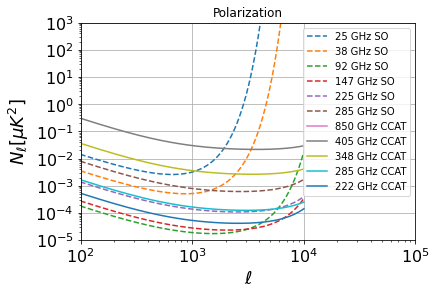

In [5]:
import sys
sys.path.append('/Users/stevekchoi/work/util/foregrounds')
sys.path.append('/Users/stevekchoi/work/ps/psc')
import sc_freq_scale as sfs
import pcl_actpol_utility_v4 as pau
from so_models_v3 import SO_Noise_Calculator_Public_v3_1_1 as SO_noise
mode = 'baseline'
fsky = 0.4
lat = SO_noise.SOLatV3point1(mode,survey_years=5.,survey_efficiency = 0.2*0.85)
lat_lmax = 10000

so_freq_list = np.array([25.7, 38.9, 92, 147.5, 225.7, 285.4])

ell_LA, N_ell_LA_T_full,N_ell_LA_P_full = lat.get_noise_curves(
        fsky, lat_lmax, 1, full_covar=False, deconv_beam=True)

for curves, labels, title in zip([N_ell_LA_T_full, N_ell_LA_P_full], [so_freq_list] * 2, ["Temperature", "Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell_LA, curve, label=str(int(label))+' GHz')
    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**4)
    plt.ylim(10**-5, 10**3)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()


for curves, labels, title in zip([N_ell_LA_T_full], [so_freq_list] , ["Temperature"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell_LA, curve, label=str(int(label))+' GHz SO',linestyle='--')

for curves, labels, title in zip([N_ell_T_full], [inputs["centerFrequency"]] , ["Temperature"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell, curve, label=str(int(label/1e9))+' GHz CCAT')

    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**5)
    plt.ylim(10**-5, 10**3)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()

for curves, labels, title in zip([N_ell_LA_P_full], [so_freq_list] , ["Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell_LA, curve, label=str(int(label))+' GHz SO',linestyle='--')

for curves, labels, title in zip([N_ell_P_full], [inputs["centerFrequency"]] , ["Polarization"]):
    for curve, label in zip(curves, labels):
        plt.plot(ell, curve, label=str(int(label/1e9))+' GHz CCAT')

    plt.yscale('log')
    plt.xscale('log')
    plt.xlim(10**2, 10**5)
    plt.ylim(10**-5, 10**3)
    plt.xlabel('$\ell$',fontsize=18)
    plt.ylabel('$N_\ell [\mu K^2]$',fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid()
    plt.show()





zf: 0.49882921734272734


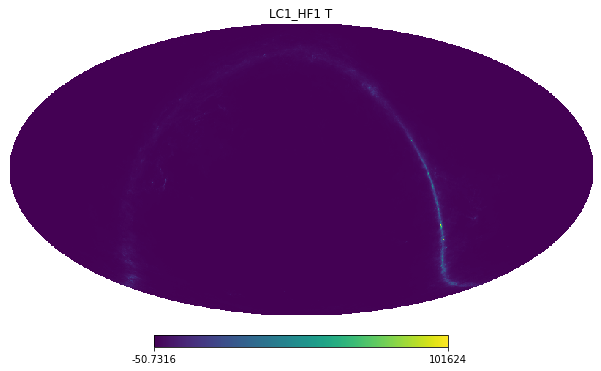

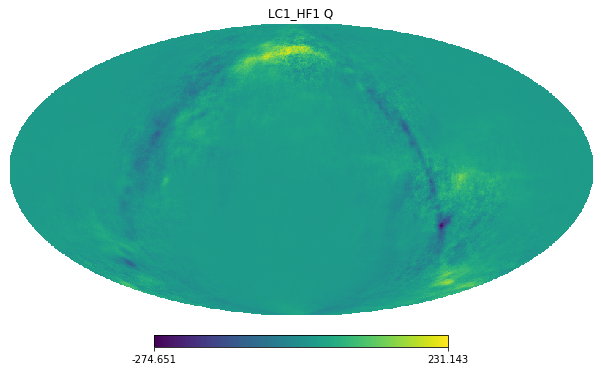

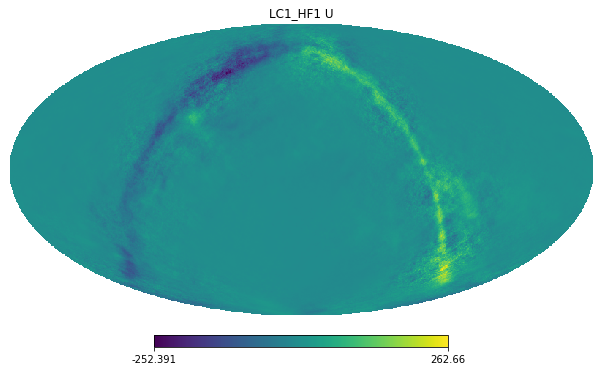

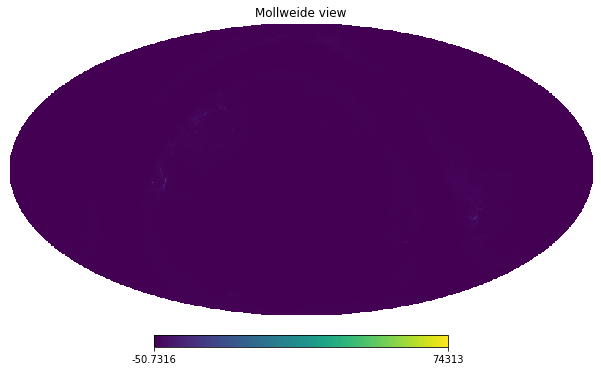

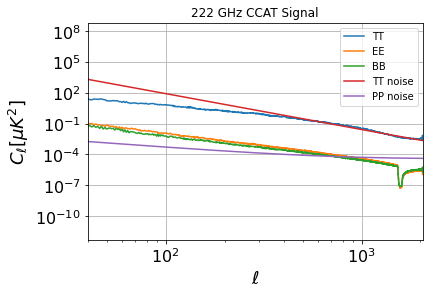

...

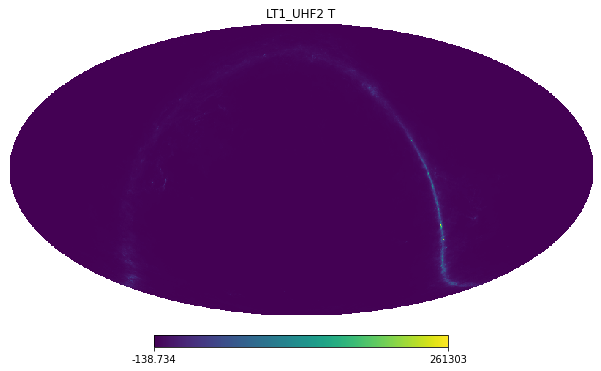

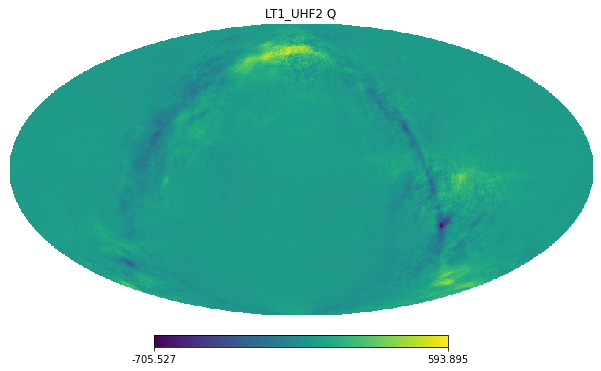

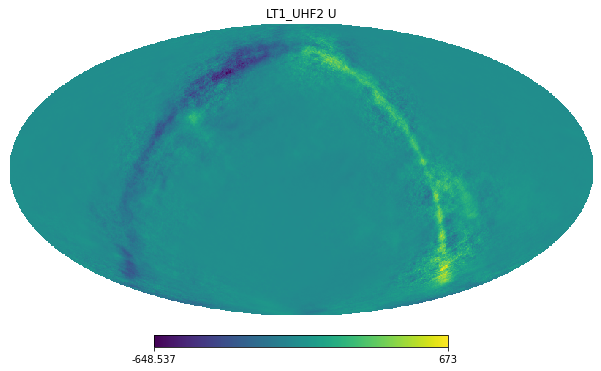

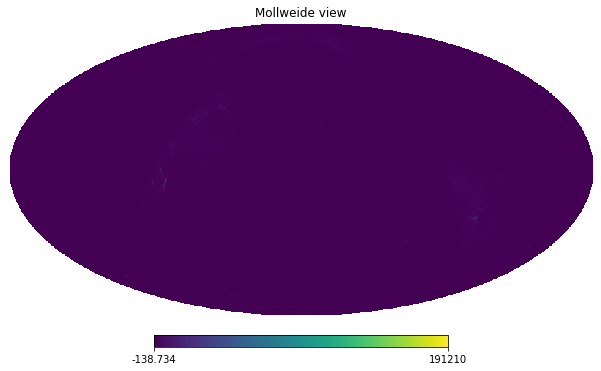

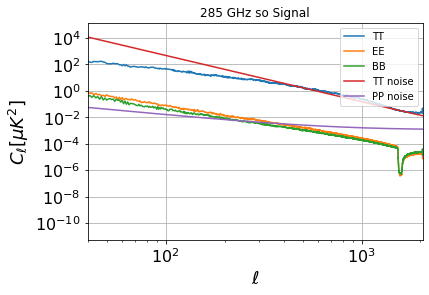

Retrieve data for LT6_LF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT6_LF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


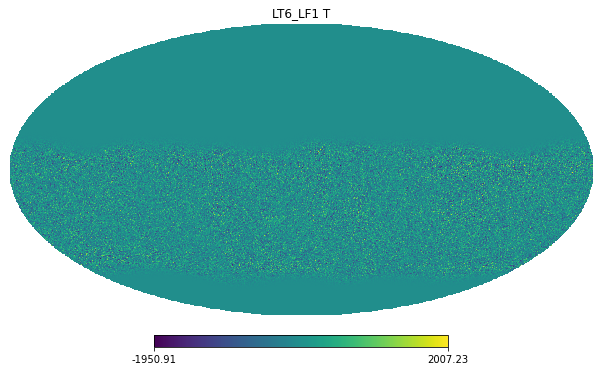

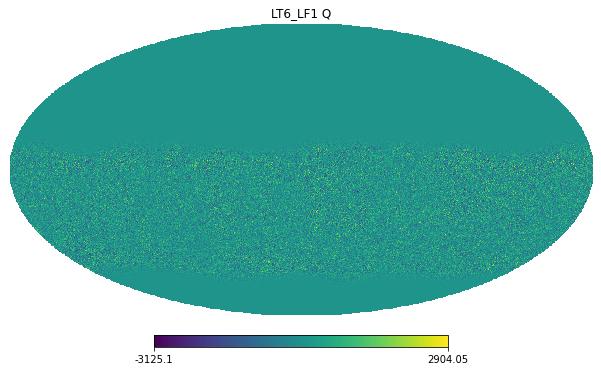

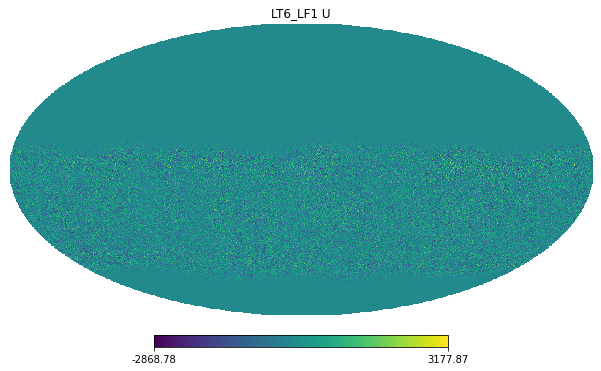

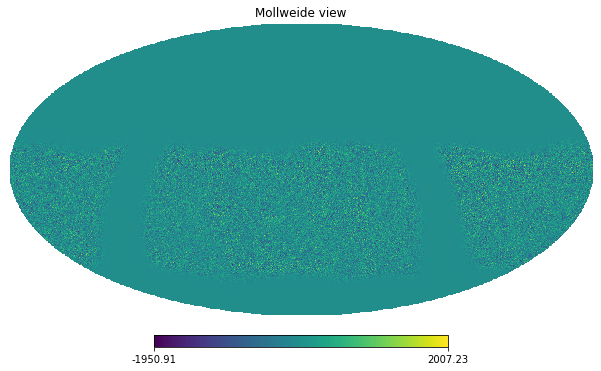

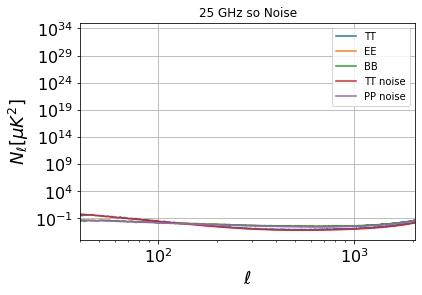

Retrieve data for LT6_LF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT6_LF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


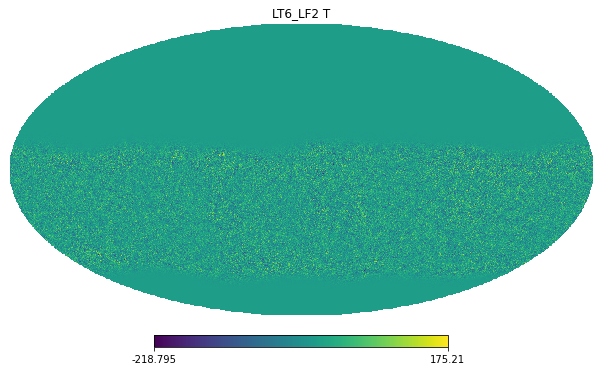

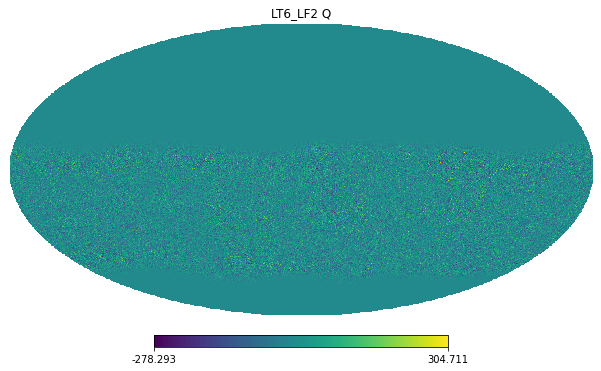

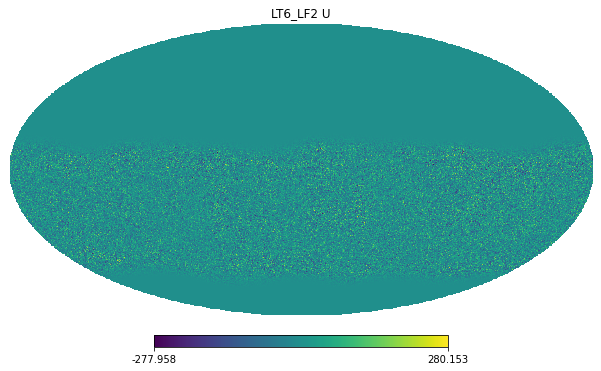

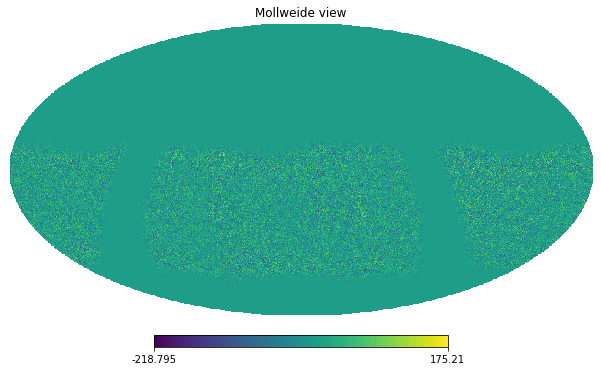

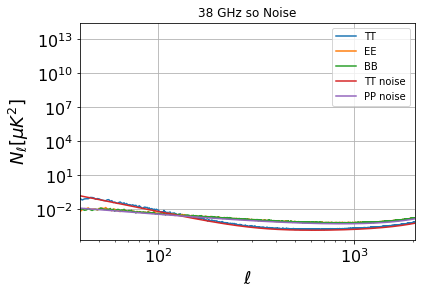

Retrieve data for LT2_MFF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT2_MFF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


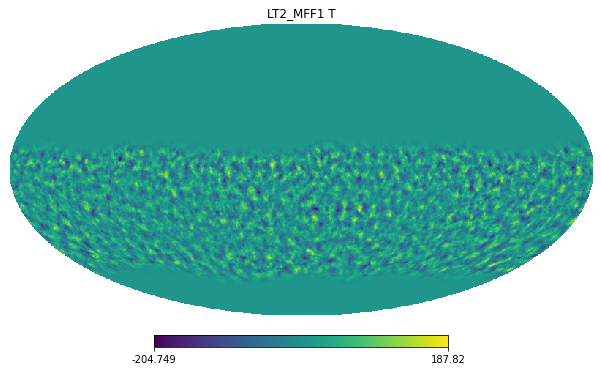

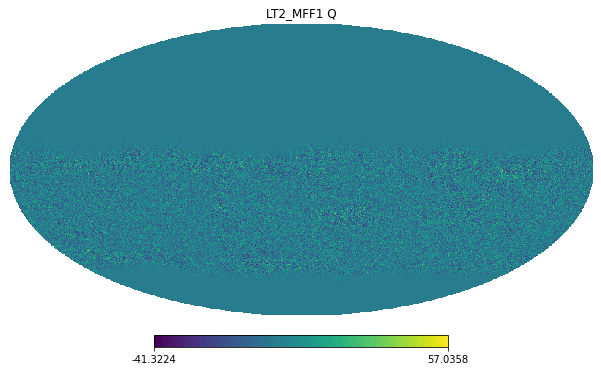

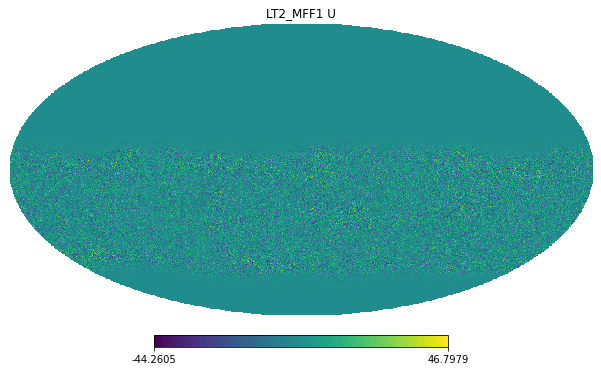

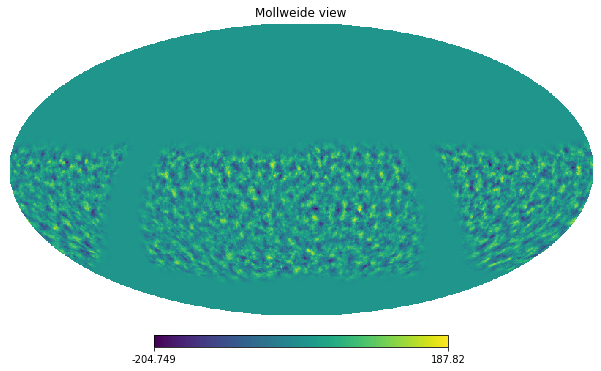

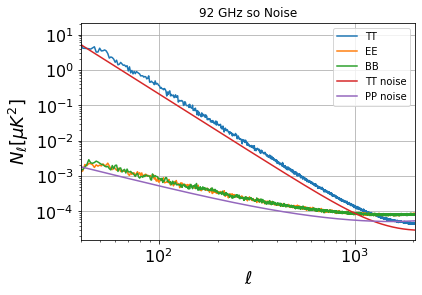

Retrieve data for LT2_MFF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT2_MFF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


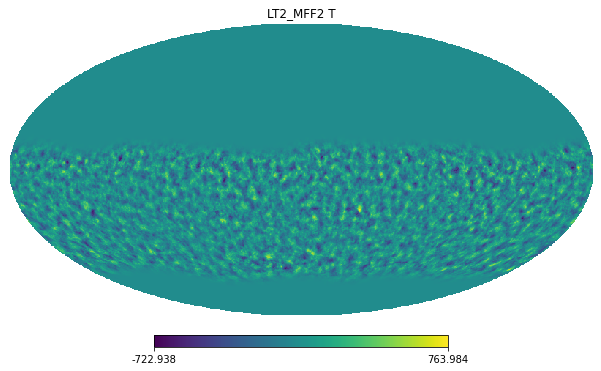

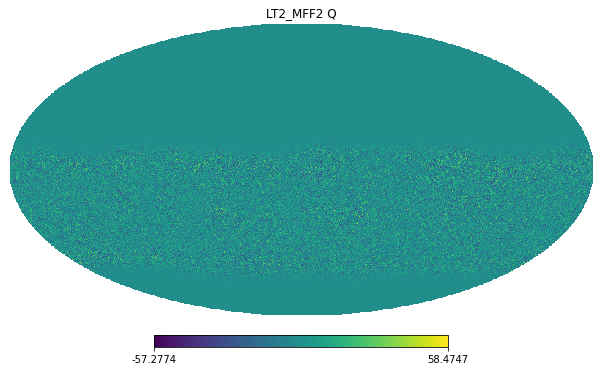

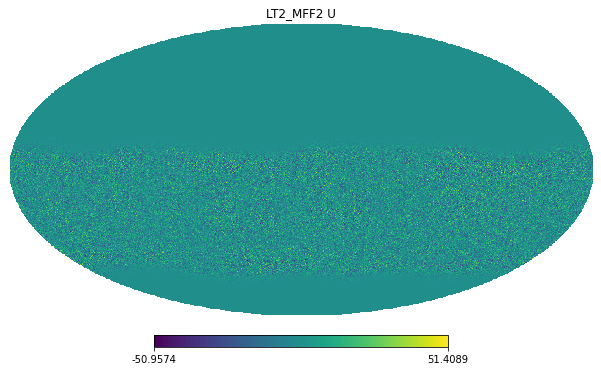

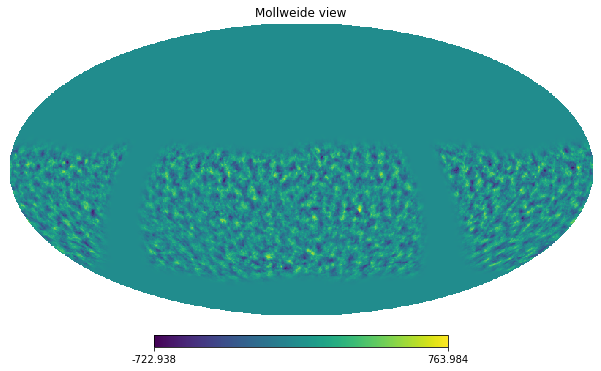

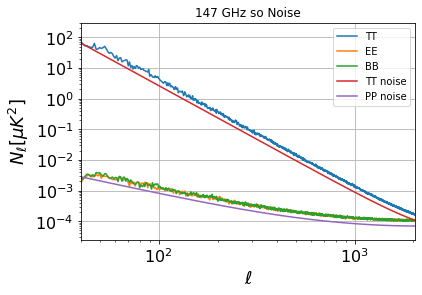

Retrieve data for LT1_UHF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT1_UHF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


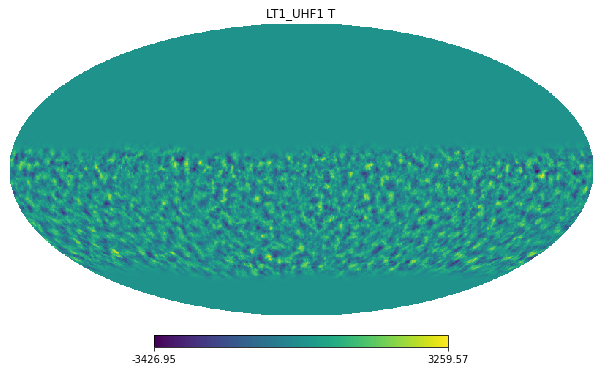

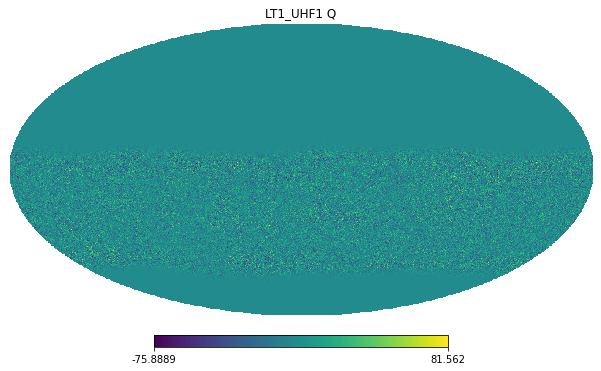

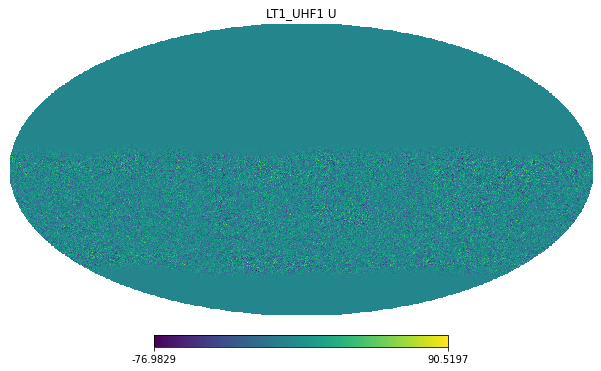

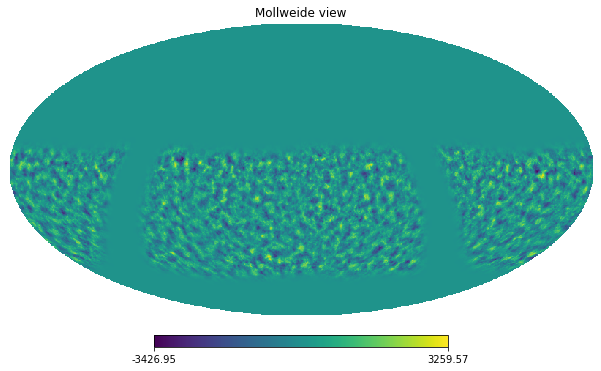

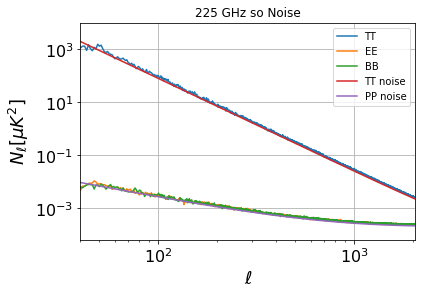

Retrieve data for LT1_UHF1_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)
Retrieve data for LT1_UHF2_01_of_20.nominal_telescope_all_time_all_hmap.fits.gz (if not cached already)


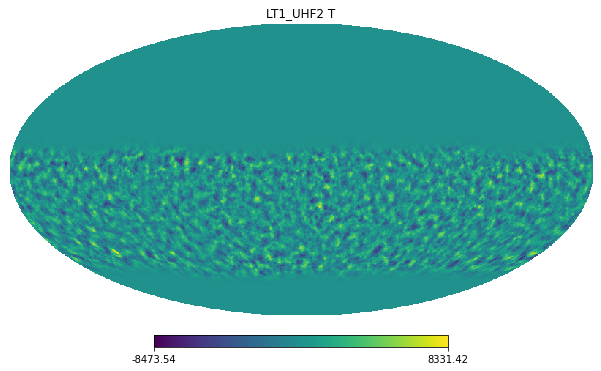

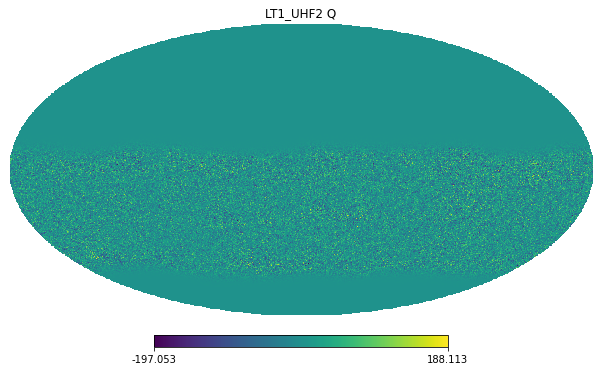

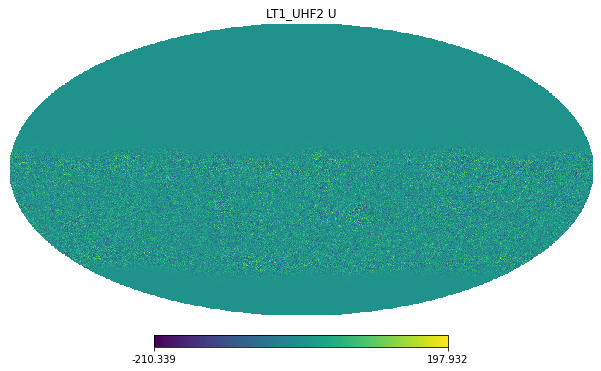

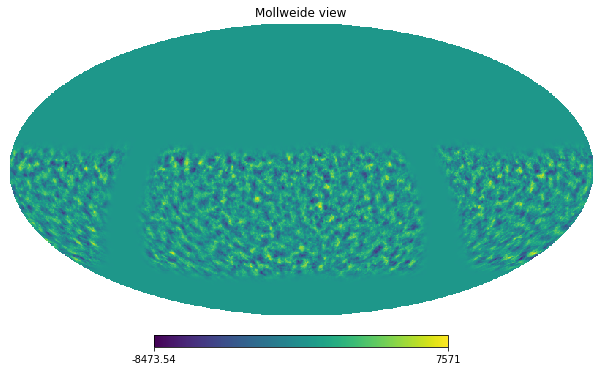

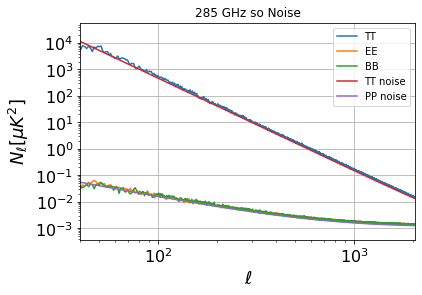

In [10]:
import healpy as hp

seed = 0
NSIDE = 1024
hitmap_path = "/Users/stevekchoi/work/build/Sensitivity-Calculator/src/sensitivity_calculator/data/ccat_uniform_coverage_nside" + str(NSIDE) + "_201021.fits"
mask_path = "/Users/stevekchoi/work/build/Sensitivity-Calculator/src/sensitivity_calculator/data/nside" + str(NSIDE) + "_lat_cut_b10_230619.fits"
# zf = sens.zeroHitmapFraction(hitmap_path, NSIDE)
def get_hivon_fsky(mask):
    npix = len(mask)
    non0 = np.where(mask!=0)[0]
    fs = len(non0)/float(npix)
    w2 = np.sum(mask[non0]**2)/(npix*fs)
    w4 = np.sum(mask[non0]**4)/(npix*fs)
    return fs*w2**2/w4

# hitmap = hp.ud_grade(
#             hp.read_map(hitmap_path, dtype=np.float64),
#             nside_out=NSIDE,
#         )

# galmask = hp.ud_grade(
#             hp.read_map(mask_path, dtype=np.float64),
#             nside_out=NSIDE,
#         )


hitm = hp.read_map(hitmap_path)
maskm = hp.read_map(mask_path)
zf = get_hivon_fsky(hitm*maskm)

print("zf:", zf)

freq_list = np.array([222,280,348,405,850])

ccat_col = []
#a1,f1,c1,co1,cib1,tsz1,ksz1,rg1
for pysm_components, sim_noise in zip(["d0,s0,cib1,tsz1,ksz1", None], [False, True]):
    for i in range(1,6):
        band = "HF%i"%i
        instrument = "LC%i"%i
        freq = "%i GHz"%freq_list[i-1]
        nl_ind = 5-i
        ccat_sim = sens.ccat_mapsims(
            inputs, outputs, band, instrument, pysm_components, seed, data_C, sim_cmb=False, sim_noise=sim_noise, hitmap_path=hitmap_path, NSIDE=NSIDE)
        hp.mollview(maskm*ccat_sim[0])
        plt.show()
        ccat_cls = hp.sphtfunc.anafast(maskm*ccat_sim)
        ell_ccat = np.arange(len(ccat_cls[0]))
        ccat_col.append(ccat_cls)
        lmax = NSIDE*2
        plt.plot(ell_ccat,ccat_cls[0]/zf,label='TT')
        plt.plot(ell_ccat,ccat_cls[1]/zf,label='EE')
        plt.plot(ell_ccat,ccat_cls[2]/zf,label='BB')
        plt.plot(ell,N_ell_T_full[nl_ind],label='TT noise')
        plt.plot(ell,N_ell_P_full[nl_ind],label='PP noise')
        plt.title("%s CCAT "%freq + ("Noise" if sim_noise else "Signal"))
        plt.yscale('log')
        plt.xscale('log')
        plt.xlim(4*10**1, lmax)
#         plt.ylim(10**-5, 10**12)
        plt.xlabel('$\ell$',fontsize=18)
        plt.ylabel(("$N_\ell$" if sim_noise else "$C_\ell$")+'$ [\mu K^2]$',fontsize=18)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.legend(loc='upper right')
        plt.grid()
        plt.show()
#         sens.plotPowerSpectrum(ccat_cls[0], ccat_cls[1], ccat_cls[2],
#                           "%s CCAT "%freq + ("Noise" if sim_noise else "Signal"), zf=zf, TT_theory=N_ell_T_full[nl_ind], PP_theory=N_ell_P_full[nl_ind])


# so280 = sens.so_mapsims("UHF2", "LT0", pysm_components,
#                    seed, sim_cmb=False, sim_noise=sim_noise, NSIDE=NSIDE, hitmap=hitmap)
# so280cls = hp.sphtfunc.anafast(so280)
# sens.plotPowerSpectrum(so280cls[0], so280cls[1], so280cls[2],
#                   "280 GHz SO " + ("Noise" if sim_noise else "Signal"), zf=zf)

so_bands = ['LF1','LF2','MFF1','MFF2','UHF1','UHF2']
so_instruments = ['LT6','LT6','LT2','LT2','LT1','LT1']
so_freq_list = np.array([25.7, 38.9, 92, 147.5, 225.7, 285.4])
ell_s = 30
so_col = []
for pysm_components, sim_noise in zip(["d0,s0,cib1,tsz1,ksz1", None], [False, True]):
    for i in range(6):
        band = so_bands[i]
        instrument = so_instruments[i]
        freq = "%i GHz"%so_freq_list[i]
        nl_ind = i
        so_sim = sens.so_mapsims(band, instrument, pysm_components, seed, sim_cmb=False, 
                                 sim_noise=sim_noise, hitmap=hitm, NSIDE=NSIDE)
        hp.mollview(maskm*so_sim[0])
        plt.show()
        so_cls = hp.sphtfunc.anafast(maskm*so_sim)
        ell_so = np.arange(len(so_cls[0]))
        so_col.append(so_cls)
        lmax = NSIDE*2
        plt.plot(ell_so[ell_s:],so_cls[0][ell_s:]/zf,label='TT')
        plt.plot(ell_so[ell_s:],so_cls[1][ell_s:]/zf,label='EE')
        plt.plot(ell_so[ell_s:],so_cls[2][ell_s:]/zf,label='BB')
        if 'MF' in band:
            plt.plot(ell_LA[ell_s:],N_ell_LA_T_full[i][ell_s:]*3,label='TT noise')
            plt.plot(ell_LA[ell_s:],N_ell_LA_P_full[i][ell_s:]*3,label='PP noise')
        if 'HF' in band:
            plt.plot(ell_LA[ell_s:],N_ell_LA_T_full[i][ell_s:]*2,label='TT noise')
            plt.plot(ell_LA[ell_s:],N_ell_LA_P_full[i][ell_s:]*2,label='PP noise')     
        if 'LF' in band:
            plt.plot(ell_LA[ell_s:],N_ell_LA_T_full[i][ell_s:],label='TT noise')
            plt.plot(ell_LA[ell_s:],N_ell_LA_P_full[i][ell_s:],label='PP noise')            
        plt.title("%s so "%freq + ("Noise" if sim_noise else "Signal"))
        plt.yscale('log')
        plt.xscale('log')
        plt.xlim(4*10**1, lmax)
#         plt.ylim(10**-5, 10**12)
        plt.xlabel('$\ell$',fontsize=18)
        plt.ylabel(("$N_\ell$" if sim_noise else "$C_\ell$")+'$ [\mu K^2]$',fontsize=18)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.legend(loc='upper right')
        plt.grid()
        plt.show()
#         sens.plotPowerSpectrum(so_cls[0], so_cls[1], so_cls[2],
#                           "%s CCAT "%freq + ("Noise" if sim_noise else "Signal"), zf=zf, TT_theory=N_ell_T_full[nl_ind], PP_theory=N_ell_P_full[nl_ind])


Text(0.5, 1.0, '')

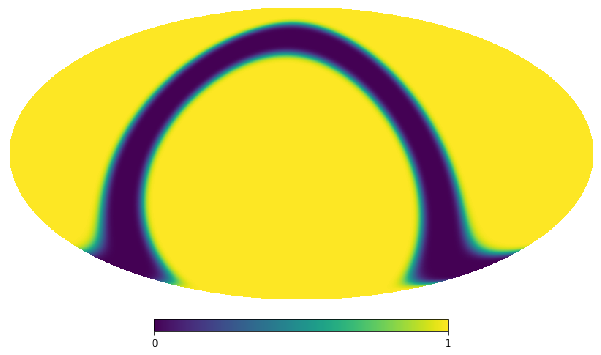

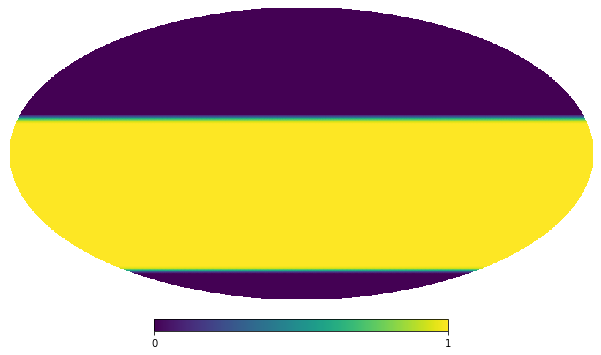

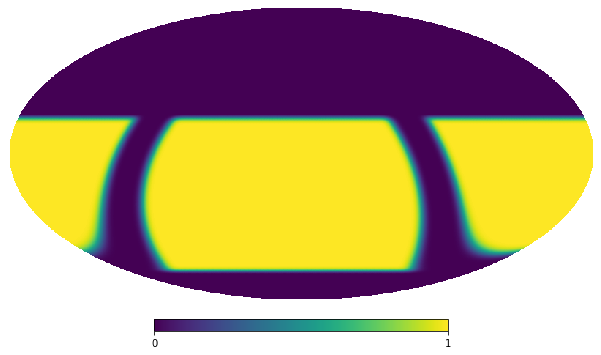

In [11]:
NSIDE = 1024
hitmap_path = "/Users/stevekchoi/work/build/Sensitivity-Calculator/src/sensitivity_calculator/data/ccat_uniform_coverage_nside" + str(NSIDE) + "_201021.fits"
mask_path = "/Users/stevekchoi/work/build/Sensitivity-Calculator/src/sensitivity_calculator/data/nside" + str(NSIDE) + "_lat_cut_b10_230619.fits"
hitm = hp.read_map(hitmap_path)
maskm = hp.read_map(mask_path)
hp.mollview(maskm)
plt.title('')
hp.mollview(hitm)
plt.title('')
hp.mollview(hitm*maskm)
plt.title('')


In [12]:
so_col = np.array(so_col)[:,:3].reshape(2,6,3,-1)
so_col.shape

(2, 6, 3, 3072)

In [13]:
ccat_col = np.array(ccat_col)[:,:3].reshape(2,5,3,-1)
ccat_col.shape

(2, 5, 3, 3072)

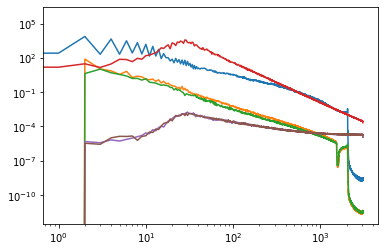

In [14]:
plt.plot(ccat_col[0,0,0])
plt.plot(ccat_col[0,0,1])
plt.plot(ccat_col[0,0,2])
plt.plot(ccat_col[1,0,0])
plt.plot(ccat_col[1,0,1])
plt.plot(ccat_col[1,0,2])
plt.xscale('log')
plt.yscale('log')

In [15]:
freq_list = np.array(freq_list)
beta_d = 1.54
T_dust = 20
beta_s = -2.95
# sfs.CMB_to_A(freq_list)
# sfs.pl_dust_power(freq_list,353.,beta_d,T_dust)
# sfs.sync_power(so_freq_list,23.,beta_s)
# sfs.A_to_CMB(freq_list)

([<matplotlib.axis.XTick at 0x163b41b50>,
 [Text(20, 0, '20'),
  Text(30, 0, '30'),
  Text(50, 0, '50'),
  Text(70, 0, '70'),
  Text(100, 0, '100'),
  Text(200, 0, '200'),
  Text(300, 0, '300'),
  Text(500, 0, '500'),
  Text(1000, 0, '1000')])

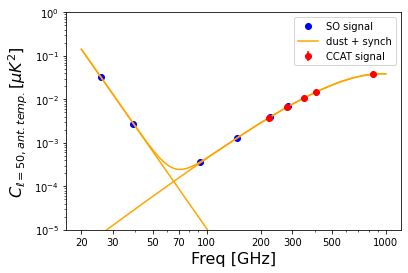

In [50]:
freq_model = np.arange(20,1000)
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.011
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.062
fg_model = dust_model + sync_model
ell0 = 50
ell_bw = 10
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(so_freq_list,so_col[0,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')
plt.plot(freq_model,dust_model,'-',color='Orange')
plt.plot(freq_model,sync_model,'-',color='Orange')
plt.ylim(1e-5,1)
plt.legend(loc=0)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)


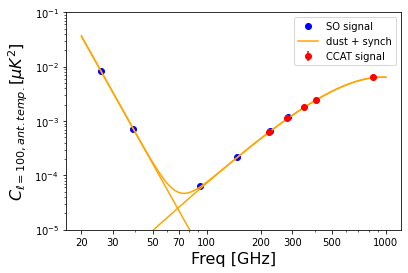

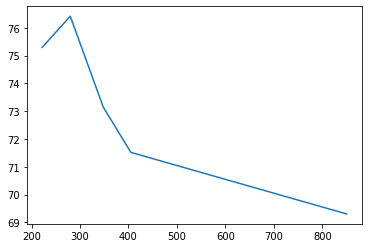

In [51]:
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.00182
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.016
fg_model = dust_model + sync_model
ell0 = 100
ell_bw = 60
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(so_freq_list,so_col[0,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')
plt.plot(freq_model,dust_model,'-',color='Orange')
plt.plot(freq_model,sync_model,'-',color='Orange')
plt.ylim(1e-5,1e-1)
plt.legend(loc=0)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)
plt.show()

# plt.plot(freq_list,ccat_sig/ccat_err)
# plt.show()

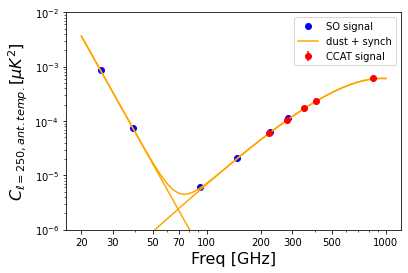

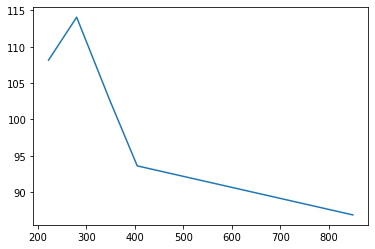

In [54]:
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.000173
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.0016
fg_model = dust_model + sync_model
ell0 = 250
ell_bw = 60
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(so_freq_list,so_col[0,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')
plt.plot(freq_model,dust_model,'-',color='Orange')
plt.plot(freq_model,sync_model,'-',color='Orange')
plt.ylim(1e-6,1e-2)
plt.legend(loc=0)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)
plt.show()

# plt.plot(freq_list,ccat_sig/ccat_err)
# plt.show()

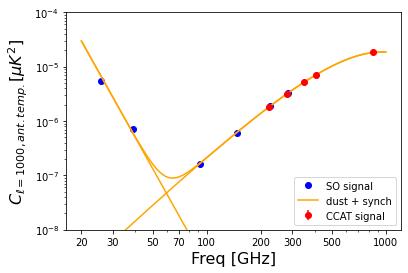

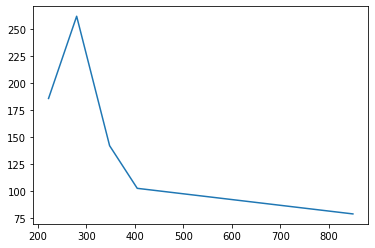

In [56]:
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.0000053
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.000013
fg_model = dust_model + sync_model
ell0 = 1000
ell_bw = 200
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(so_freq_list,so_col[0,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')
plt.plot(freq_model,dust_model,'-',color='Orange')
plt.plot(freq_model,sync_model,'-',color='Orange')
plt.ylim(1e-8,1e-4)
plt.legend(loc=0)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)
plt.show()

plt.plot(freq_list,ccat_sig/ccat_err)
plt.show()

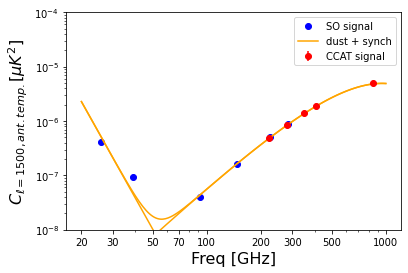

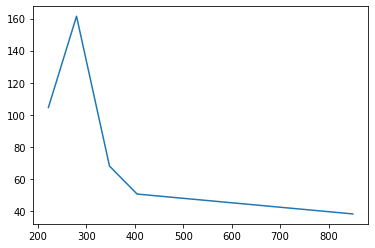

In [67]:
dust_model = sfs.pl_dust_power(freq_model,353.,beta_d,T_dust)*0.0000014
sync_model = sfs.sync_power(freq_model,23.,beta_s)*0.000001
fg_model = dust_model + sync_model
ell0 = 1500
ell_bw = 200
gfac = pau.get_analytic_var_auto(zf,ell0,ell_bw)
ccat_sig = ccat_col[0,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_noise = ccat_col[1,:,1,ell0]*sfs.CMB_to_A(freq_list)**2
ccat_err = gfac*(ccat_sig+ccat_noise)
plt.plot(so_freq_list,so_col[0,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'o',color='Blue',label='SO signal')
# plt.plot(so_freq_list,so_col[1,:,1,ell0]*sfs.CMB_to_A(so_freq_list)**2,'x',color='Blue',label='SO noise')
plt.errorbar(freq_list,ccat_sig,ccat_err,fmt='o',color='Red',label='CCAT signal')
# plt.plot(freq_list,ccat_noise,'x',color='Red',label='CCAT noise')
plt.plot(freq_model,fg_model,'-',color='Orange',label='dust + synch')
plt.plot(freq_model,dust_model,'-',color='Orange')
plt.plot(freq_model,sync_model,'-',color='Orange')
plt.ylim(1e-8,1e-4)
plt.legend(loc=0)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Freq [GHz]',fontsize=16)
plt.ylabel('$C_{\ell=%i, ant. temp.} [\mu K^2]$'%ell0,fontsize=16)
xticks = [20,30,50,70,100,200,300,500,1000]
plt.xticks(xticks,xticks)
plt.show()

plt.plot(freq_list,ccat_sig/ccat_err)
plt.show()